## Introduction & Understanding The Data

Whether we realize it or not, without steel our modern society would be very different! Infrastructure built with steel is resilient to heavy stress from human and nature, and therefore the production of steel is an important process. This competition asks us to help make the production process of steel more efficient by identifying defects. 

In this notebook, I will do an exploratory data analysis and visualization to get me and you familiar with the dataset for this competition. In another kernel, [ResUNet-a Baseline on TensorFlow
](https://www.kaggle.com/ekhtiar/resunet-a-baseline-on-tensorflow), we focus on the model to predict the faults.

**If you like my work please upvote this Kernel. This encourages or motivates people like me, who contributes to Kaggle on their own time with the intention to share knowledge, to continue the effort. Furthermore, if I made a mistake or can do something more, please leave a comment in the comments section to help me out. Many thanks in advance!**

In [1]:
# some basic imports
import pandas as pd
import numpy as np
import os
import cv2
# visualization
import matplotlib.pyplot as plt
# plotly offline imports
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly import subplots
import plotly.express as px
import plotly.figure_factory as ff
from plotly.graph_objs import *
from plotly.graph_objs.layout import Margin, YAxis, XAxis
init_notebook_mode()
# frequent pattern mining
from mlxtend.frequent_patterns import fpgrowth
# path where all the training images are
img_path = '../input/train_images/'

This competition is about **semantic segmentation**. That is there are possibly four class of defects in one image and we need to identify each type of defects. In the train file, the first column has the image id and class id seperated by a underscore. For example, in the cell below the image 0002cc93b.jpg has a fault class 1 and the mask for this fault is given. There are four fault classes and so each image appears four times in the train.csv dataset. 

In [2]:
# reading the csv file 
pd.read_csv('../input/train.csv').head()

,ImageId,ClassId,EncodedPixels
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...
2,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...
3,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...
4,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...


In [3]:
# load full data and label no mask as -1
train_df = pd.read_csv('../input/train.csv').fillna(-1)

In [4]:
#reading first 5 rows of csv file
train_df.head()

,ImageId,ClassId,EncodedPixels
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...
2,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...
3,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...
4,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...


In [5]:
# image id and class id are two seperate entities and it makes it easier to split them up in two columns
#train_df['ImageId'] = train_df['ImageId_ClassId'].apply(lambda x: x.split('_')[0])
#train_df['ClassId'] = train_df['ImageId_ClassId'].apply(lambda x: x.split('_')[1])
# above was done already in the updated images 

# lets create a dict with class id and encoded pixels and group all the defaults per image
train_df['ClassId_EncodedPixels'] = train_df.apply(lambda row: (row['ClassId'], row['EncodedPixels']), axis = 1)
grouped_EncodedPixels = train_df.groupby('ImageId')['ClassId_EncodedPixels'].apply(list)

Now we have our modified train.csv, we answer a few basic questions below:

In [6]:
print('Total number of images: %s' % len(train_df['ImageId'].unique()))
print('Images with at least one label: %s' % len(train_df[train_df['EncodedPixels'] != -1]['ImageId'].unique()))
print('Total instance or examples of defects: %s' % len(train_df[train_df['EncodedPixels'] != -1]))

Total number of images: 6666
Images with at least one label: 6666
Total instance or examples of defects: 7095


## Visualizing The Images & The Mask
In this section we will visualize the images on which we have to predict the defect on. We will also decode the encoded masks, which shows the area of defect, on top of these images.

In [7]:
# picking up 10 examples with at two faults for visualization
examples = []
for r in grouped_EncodedPixels.iteritems():
    if (len([x[1] for x in r[1] if x[1] != -1]) == 2) and (len(examples) < 10):
        examples.append(r[0])

In [8]:
grouped_EncodedPixels[examples]

ImageId
0025bde0c.jpg    [(3, 8458 14 8707 35 8963 48 9219 71 9475 88 9...
002fc4e19.jpg    [(1, 146021 3 146275 10 146529 40 146783 46 14...
008ef3d74.jpg    [(1, 356336 4 356587 11 356838 18 357089 25 35...
00ac8372f.jpg    [(1, 101742 3 101998 12 102253 19 102301 22 10...
00c88fed0.jpg    [(1, 10474 7 10728 15 10983 18 11239 21 11494 ...
012f26693.jpg    [(3, 4396 14 4632 42 4878 61 5133 70 5388 76 5...
01cfacf80.jpg    [(3, 299116 11 299350 33 299521 6 299582 57 29...
0391d44d6.jpg    [(3, 63384 14 63640 40 63896 54 64152 54 64408...
03db6bbc3.jpg    [(3, 29096 5 29342 15 29588 25 29835 34 30081 ...
044700866.jpg    [(3, 142219 15 142475 45 142731 75 142987 90 1...
Name: ClassId_EncodedPixels, dtype: object

In [9]:
# from https://www.kaggle.com/robertkag/rle-to-mask-converter
def rle_to_mask(rle_string, height, width):
    '''
    convert RLE(run length encoding) string to numpy array

    Parameters: 
    rle_string (str): string of rle encoded mask
    height (int): height of the mask
    width (int): width of the mask 

    Returns: 
    numpy.array: numpy array of the mask
    '''
    
    rows, cols = height, width
    
    if rle_string == -1:
        return np.zeros((height, width))
    else:
        rle_numbers = [int(num_string) for num_string in rle_string.split(' ')]
        rle_pairs = np.array(rle_numbers).reshape(-1,2)
        img = np.zeros(rows*cols, dtype=np.uint8)
        for index, length in rle_pairs:
            index -= 1
            img[index:index+length] = 255
        img = img.reshape(cols,rows)
        img = img.T
        return img

In [10]:
# visualize steel image with four classes of faults in seperate columns
def viz_two_class_from_path(img_path, img_id, encoded_masks):
    '''
    visualize an image with two types of defects by plotting them on two columns
    with the defect overlayed on top of the original image.

    Parameters: 
    img_path (str): path of images
    img_id (str): image id or filename of the path
    encoded_masks (list): a list of strings of encoded masks 
    
    Returns: 
    matplotlib image plot in columns for two classes iwth defect
    '''
    
    img = cv2.imread(os.path.join(img_path, img_id))
    fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(20,10))
    cmaps = ["Reds", "Blues", "Greens", "Purples"]
    axid = 0
    for idx, encoded_mask in enumerate(encoded_masks):
        class_id = idx + 1
        if encoded_mask == -1:
            pass
        else:
            mask_decoded = rle_to_mask(encoded_mask, 256, 1600)
            ax[axid].get_xaxis().set_ticks([])
            ax[axid].get_yaxis().set_ticks([])
            ax[axid].text(0.25, 0.25, 'Image Id: %s - Class Id: %s' % (img_id, class_id), fontsize=12)
            ax[axid].imshow(img)
            ax[axid].imshow(mask_decoded, alpha=0.15, cmap=cmaps[idx])
            axid += 1

In [11]:
"""examples is the list of all the images 
we select one sample of name example 
the problem is that we expected 4 values but there can be or can not be 4 defects in an image 
"""
mask_1=None
mask_2=None
mask_3=None
mask_4=None
for i in range(len(grouped_EncodedPixels[examples])):
    if (grouped_EncodedPixels[examples][i][0]) ==1:
        mask_1=grouped_EncodedPixels[examples][i][1][1:]# 3 , 4
    elif (grouped_EncodedPixels[examples][i][0]) ==2:
        mask_2=grouped_EncodedPixels[examples][i][1][1:]
    elif (grouped_EncodedPixels[examples][i][0]) ==3:
        mask_3=grouped_EncodedPixels[examples][i][1][1:]
    elif (grouped_EncodedPixels[examples][i][0]) ==4:
        mask_4=grouped_EncodedPixels[examples][i][1][1:]

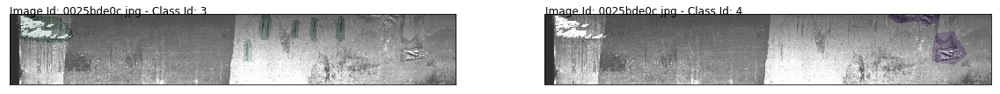

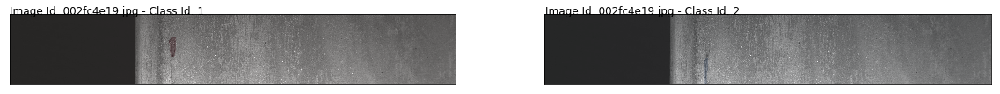

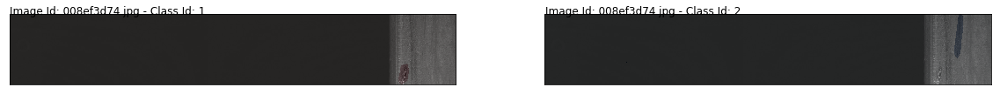

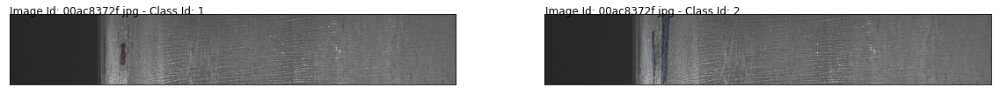

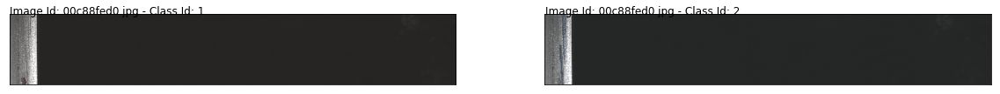

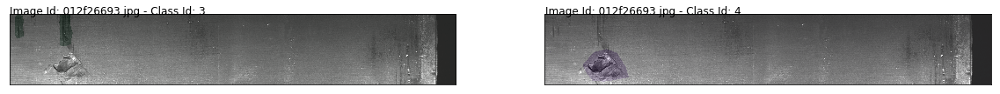

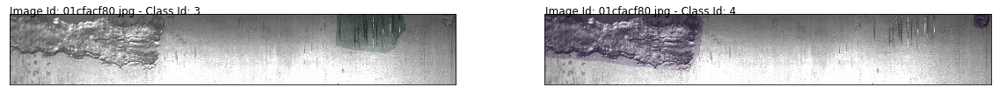

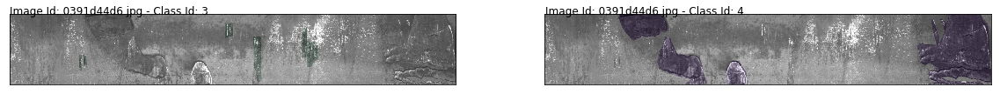

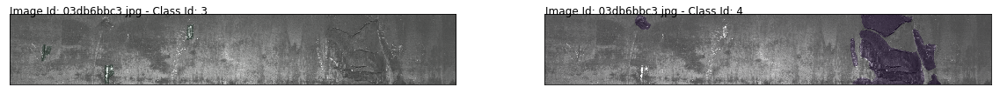

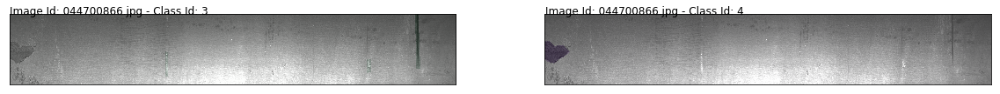

In [12]:
# visualize the image we picked up earlier with mask
for example in examples:
    img_id = example
    mask_1=-1
    mask_2=-1
    mask_3=-1
    mask_4=-1
    for i in range(len(grouped_EncodedPixels[example])):
        if (grouped_EncodedPixels[example][i][0]) ==1:
            mask_1=grouped_EncodedPixels[example][i][1][1:]# 3 , 4
        elif (grouped_EncodedPixels[example][i][0]) ==2:
            mask_2=grouped_EncodedPixels[example][i][1][1:]
        elif (grouped_EncodedPixels[example][i][0]) ==3:
            mask_3=grouped_EncodedPixels[example][i][1][1:]
        elif (grouped_EncodedPixels[example][i][0]) ==4:
            mask_4=grouped_EncodedPixels[example][i][1][1:]
    masks = [mask_1, mask_2, mask_3, mask_4]
    viz_two_class_from_path(img_path, example, masks)

The picture above gives us some idea about how defects of more than one class. Visually and logically we can understand that the different classes of Mask doesn't overlap one another. Now let's zoom into three images from each types of defects to understand their patterns a little bit better.

In [13]:
# visualize steel image with four classes of faults in seperate columns
def viz_one_class_from_path(img_path, img_id, mask, class_id, text=None):
    '''
    visualize an image with two types of defects by plotting them on two columns
    with the defect overlayed on top of the original image.

    Parameters: 
    img_path (str): path of images
    img_id (str): image id or filename of the path
    encoded_mask (str): RLE mask
    class_id (str): class id of the defect
    
    Returns: 
    matplotlib image plot in columns for two classes with defect
    '''
    img = cv2.imread(os.path.join(img_path, img_id))
    mask_decoded = rle_to_mask(mask, 256, 1600)
    fig, ax = plt.subplots(figsize=(20,10))
    cmaps = ["Reds", "Blues", "Greens", "Purples"]
    ax.get_xaxis().set_ticks([])
    ax.get_yaxis().set_ticks([])
    if text: 
        ax.text(0.25, 0.25, text, fontsize=12)
    ax.imshow(img)
    ax.imshow(mask_decoded, alpha=0.15, cmap=cmaps[int(class_id)-1])

def viz_per_class(train_df, class_id, sample_size=5):
    class_samples = train_df[(train_df['ClassId']==class_id)&(train_df['EncodedPixels']!=-1)].sample(sample_size)
    class_img_ids = class_samples['ImageId'].values
    class_encoded_masks = class_samples['EncodedPixels'].values
    
    for img_id, mask in zip(class_img_ids, class_encoded_masks):
        viz_one_class_from_path(img_path, img_id, mask, class_id)

# Class 1 Defects

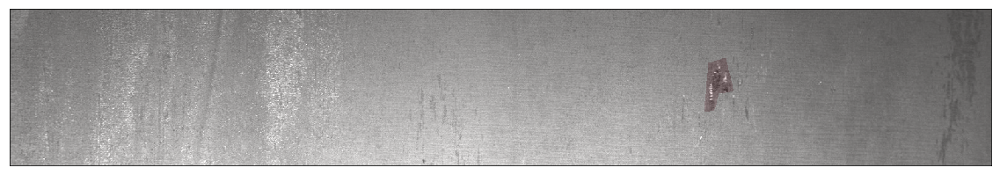

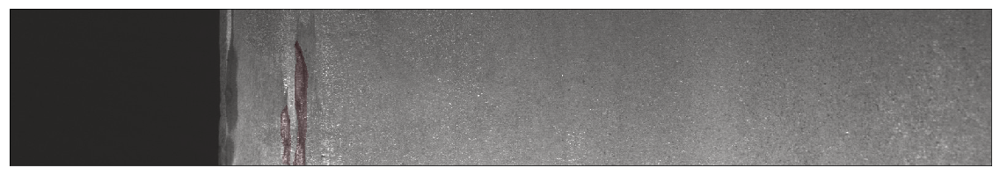

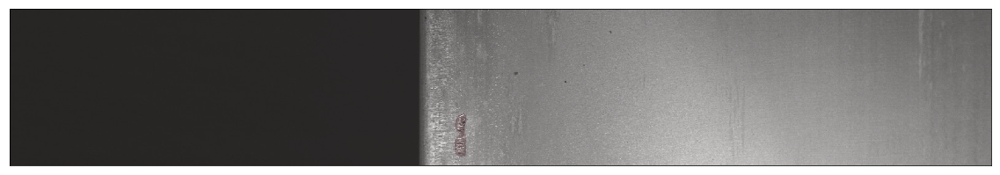

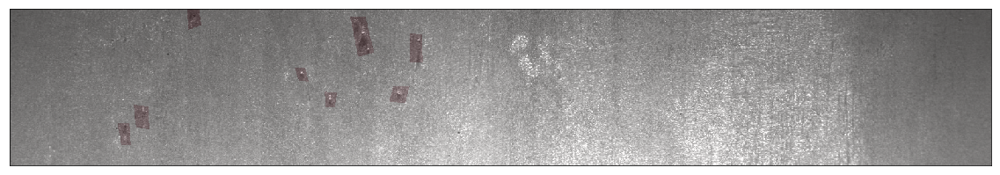

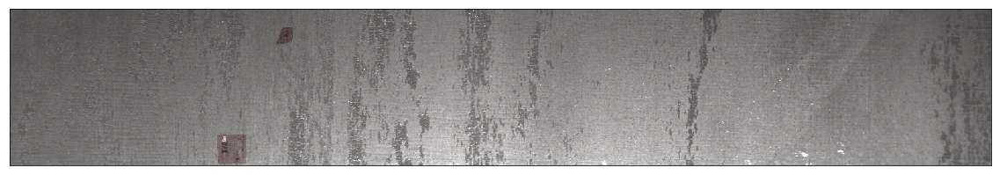

In [14]:
viz_per_class(train_df, 1)

# Class 2 Defects

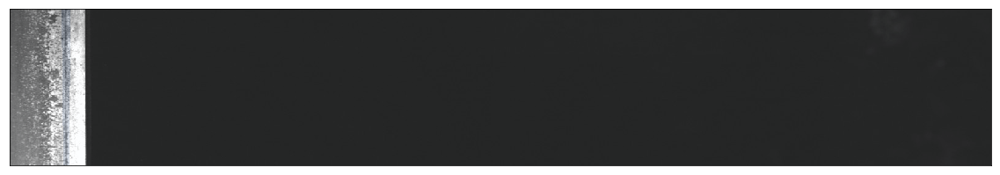

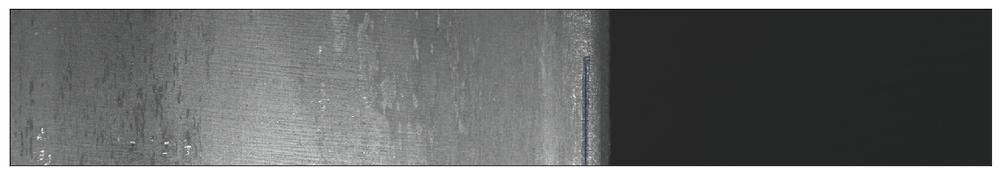

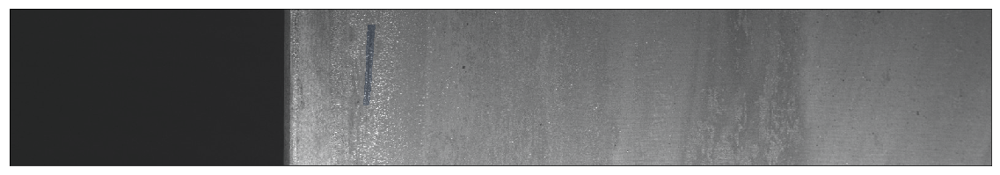

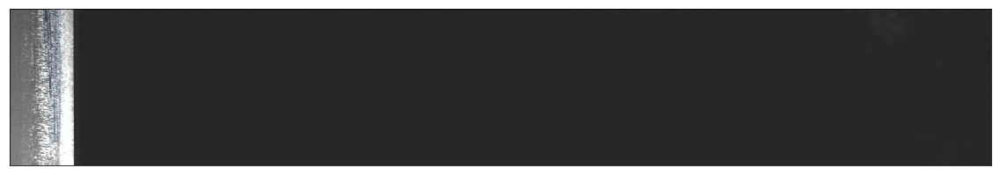

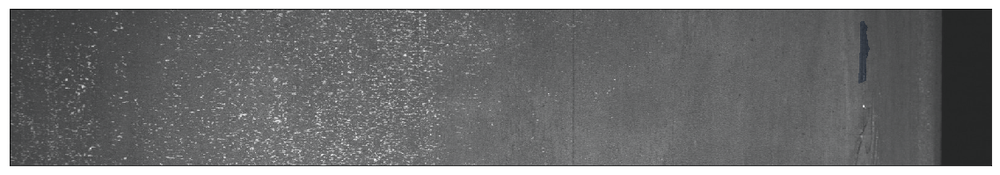

In [15]:
viz_per_class(train_df, 2)

# Class 3 defects

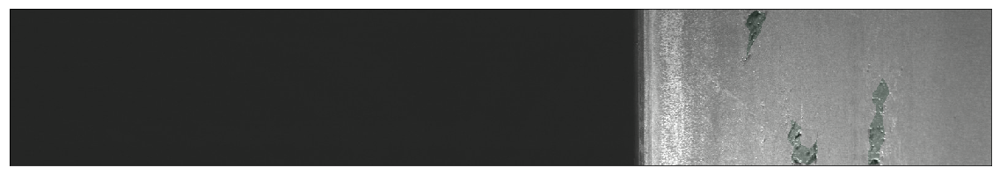

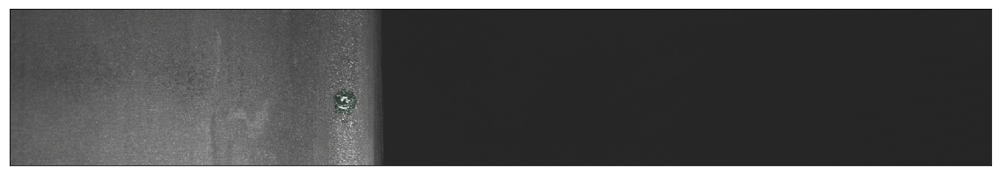

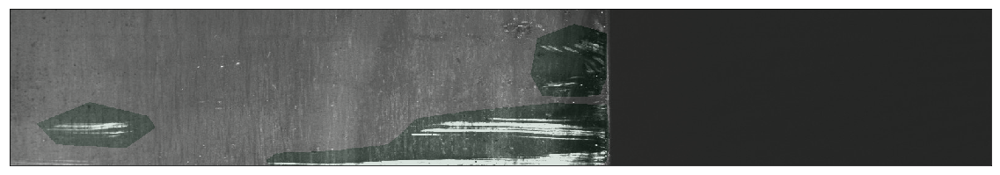

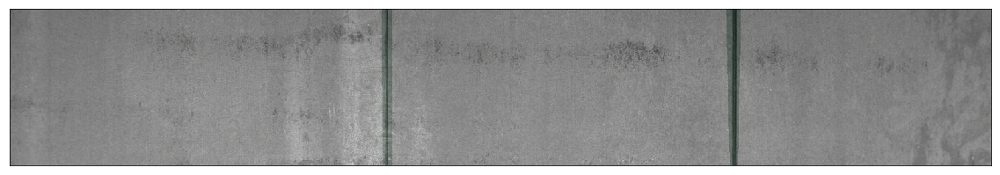

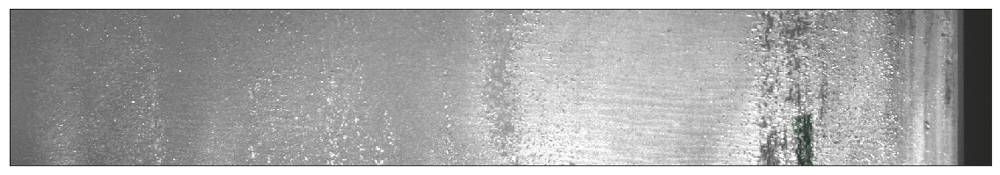

In [17]:
viz_per_class(train_df, 3)

# Class 4 defects

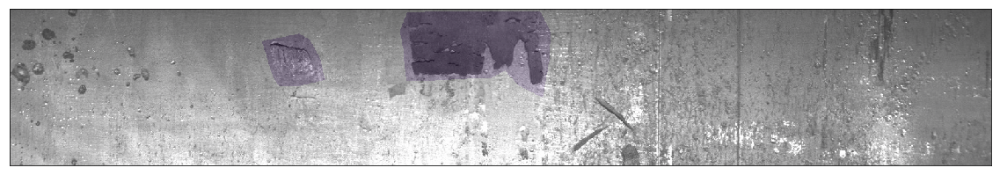

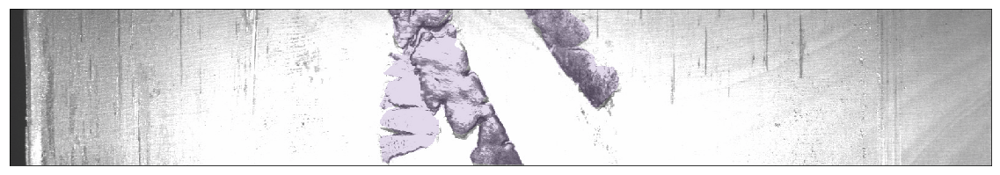

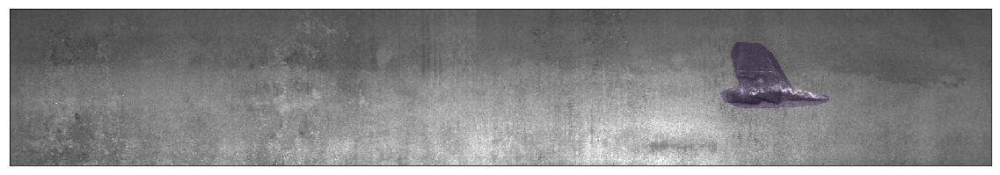

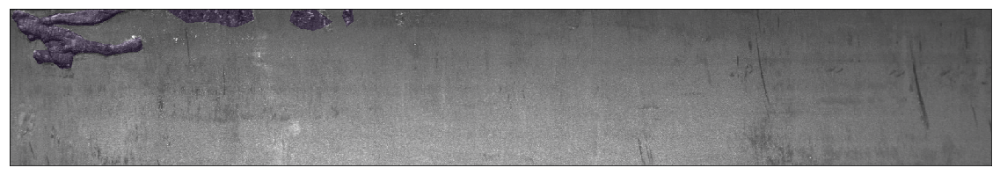

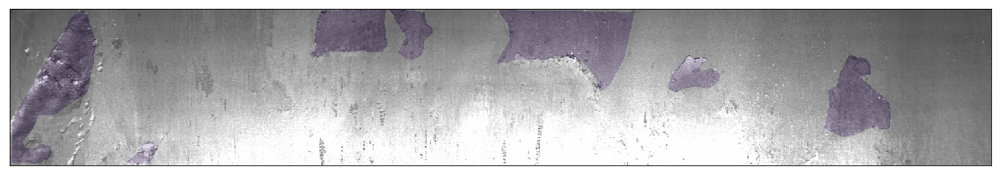

In [18]:
viz_per_class(train_df, 4)

**It's interesting to see that the masks are often exaggerated, specially for small defects.**

## Missing Labels & Defect Per Image
In this section we will look into how frequently each class is labeled in our dataset. We also noticed a large amount of dataset without any labels, so we will do a count of data with and without labels.

In [19]:
# calculate sum of the pixels for the mask per class id

train_df['mask_pixel_sum'] = train_df.apply(lambda x: rle_to_mask(x['EncodedPixels'], width=1600, height=256).sum(), axis=1)

In [20]:
# calculate the number of pictures without any label what so ever

annotation_count = grouped_EncodedPixels.apply(lambda x: 1 if len([1 for y in x if y[1] != -1]) > 0 else 0).value_counts()
annotation_count_labels = ['No Label' if x == 0 else 'Label' for x in annotation_count.index]
# calculate number of defects per image 
defects_count_df = grouped_EncodedPixels.apply(lambda x: len([1 for y in x if y[1] != -1]))
defects_count_df=defects_count_df.rename_axis('ImageId').reset_index(name='counts')


In [22]:
train_df.head()

,ImageId,ClassId,EncodedPixels,ClassId_EncodedPixels,mask_pixel_sum
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...,"(1, 29102 12 29346 24 29602 24 29858 24 30114 ...",1120980
1,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...,"(3, 18661 28 18863 82 19091 110 19347 110 1960...",1758735
2,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...,"(1, 37607 3 37858 8 38108 14 38359 20 38610 25...",2121345
3,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...,"(4, 131973 1 132228 4 132483 6 132738 8 132993...",17686035
4,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...,"(3, 229501 11 229741 33 229981 55 230221 77 23...",1237005


In [23]:
all_files =os.listdir(img_path)
csv_files=list(defects_count_df.ImageId)
print(len(all_files))
print(len(csv_files))

12568
6666


In [24]:
# for calculating number of defects per image 
for i in all_files :
    if i not in csv_files:        
        df2 = pd.DataFrame([[i, 0]],columns=["ImageId","counts"])
        defects_count_df=defects_count_df.append(df2)       

In [25]:
defects_count_df

,ImageId,counts
0,0002cc93b.jpg,1
1,0007a71bf.jpg,1
2,000a4bcdd.jpg,1
3,000f6bf48.jpg,1
4,0014fce06.jpg,1
...,...,...
0,34ded2e0e.jpg,0
0,b9d8a4502.jpg,0
0,bd02a666e.jpg,0
0,66c2e78b0.jpg,0


In [27]:
# defect counts per image 
defect_count_per_image = defects_count_df.counts.value_counts()
defect_count_labels = defect_count_per_image.index
print("defect_count_per_image")
print(defect_count_per_image.sort_index())
print("defect_count_labels" , defect_count_labels)

defect_count_per_image
0    5902
1    6239
2     425
3       2
Name: counts, dtype: int64
defect_count_labels Int64Index([1, 0, 2, 3], dtype='int64')


#### Observations
* There are a lot of images without any defect masks. I am not sure if they are examples of instances without any defect, or there are missing labels. Anyhow, I will print ten random of such instances below and let you find out more.
* Often times two types of defects are reported per image. However, most of the time, there is only one type of defect per image. And we only have two instances where there are three types of defect in a single image.

In [28]:
# images with no defects 
len(defects_count_df[defects_count_df.counts == 0])

5902

In [29]:
defects_count_df[defects_count_df.counts == 0].sample(10).ImageId

0    e3497bffb.jpg
0    a4dc8cd6c.jpg
0    8d6802553.jpg
0    2622f876d.jpg
0    4aed3c85d.jpg
0    1d7fb0fa8.jpg
0    8a3adca3c.jpg
0    7907c3a1d.jpg
0    dd44675da.jpg
0    b43e2c4d6.jpg
Name: ImageId, dtype: object

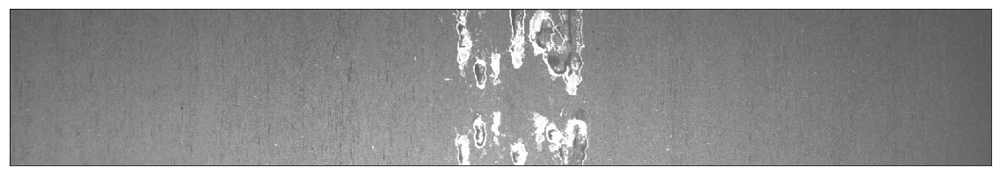

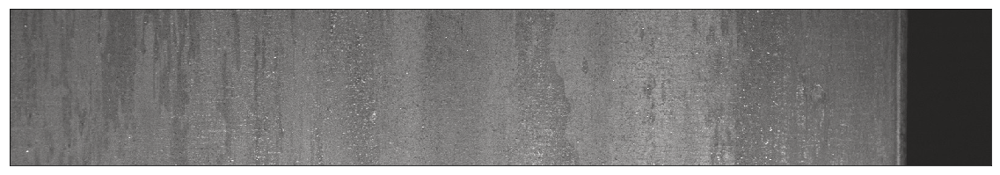

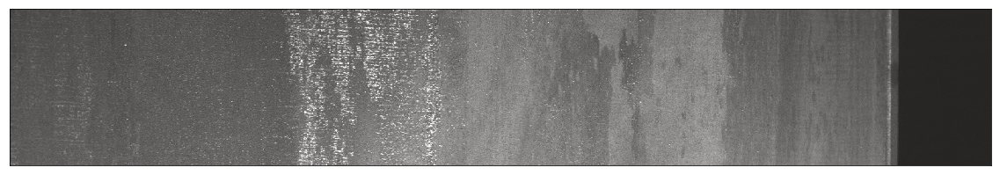

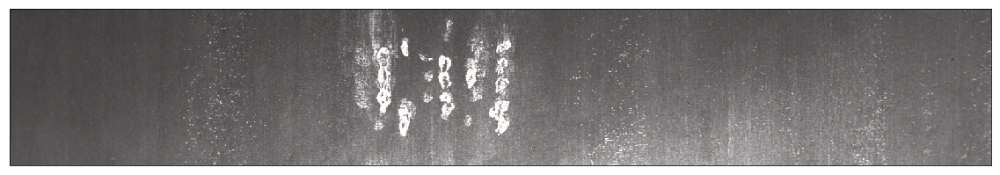

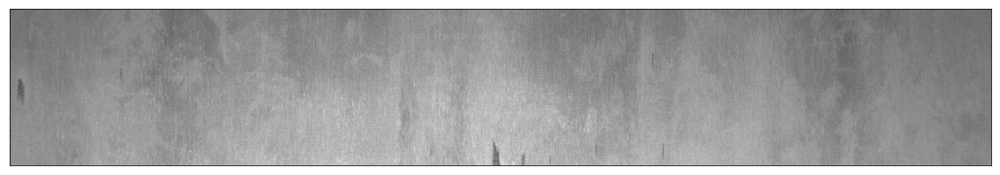

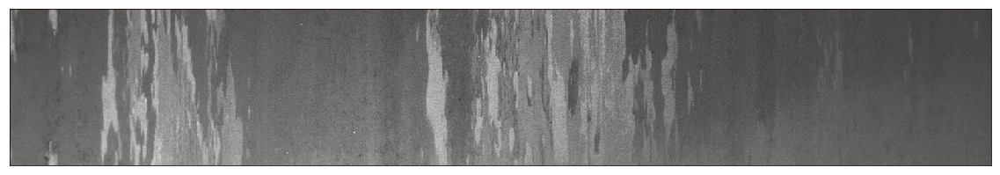

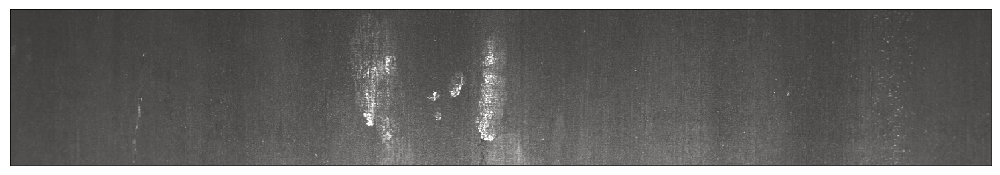

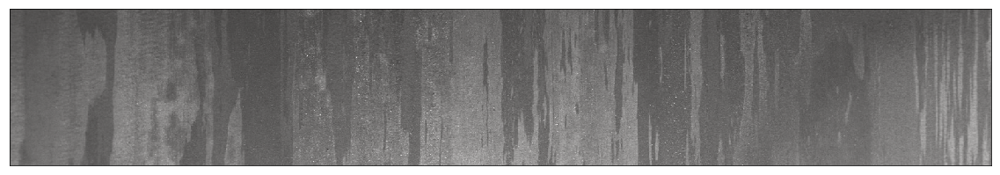

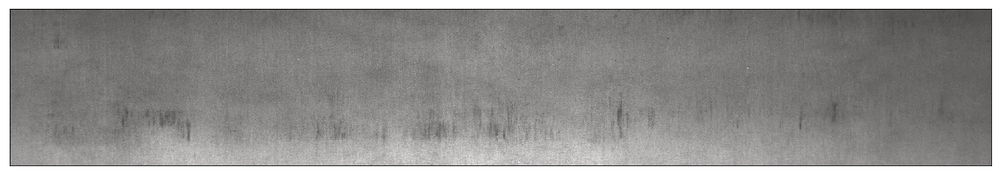

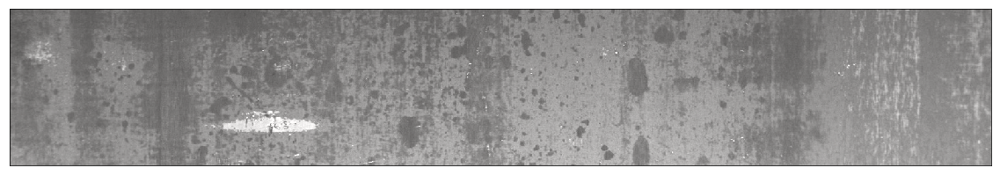

In [30]:
# print ten samples of instances without any labels thus no defects
ten_rand_samples = defects_count_df[defects_count_df.counts == 0].sample(10).ImageId
for samp in ten_rand_samples:
    viz_one_class_from_path(img_path, samp, -1,1)